### Position text file reading

##### Time , X Z and Y given in to Numpy 

In [1]:
import pandas as pd 
import matplotlib.pyplot as plt 
import matplotlib as mpl
import seaborn as sns
from matplotlib.patches import Circle
import matplotlib.tri as tri
import numpy as np
from scipy.spatial.transform import Rotation as R

Day46_fs1 = pd.read_csv('position 20190923-174441.txt',sep=" ", header=None)
Day46_fs2 = pd.read_csv('position 20190923-171112.txt',sep=" ", header=None)
Day47_fs1 = pd.read_csv('position 20191001-112411.txt',sep=" ", header=None)
Day47_fs2 = pd.read_csv('position 20191001-115127.txt',sep=" ", header=None)
Day48_fs1 = pd.read_csv('position 20191002-115000.txt',sep=" ", header=None)
Day48_fs2 = pd.read_csv('position 20191002-111038.txt',sep=" ", header=None)
%matplotlib inline
plt.style.use('seaborn')
Day46_fs1.head()

,0,1,2,3
0,1.569253e+09,-0.539727,1.209119,1.060115
1,1.569253e+09,-0.539727,1.209119,1.060115
2,1.569253e+09,-0.539727,1.209119,1.060115
3,1.569253e+09,-0.539727,1.209119,1.060115
4,1.569253e+09,-0.539727,1.209119,1.060115


### Each file needs to be corrected for beginging - Now that is fixed 

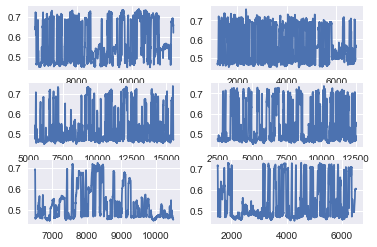

In [4]:
fig,ax = plt.subplots(3,2)
ax[0,0].plot(Day46_fs1[2] [6500:11500])
ax[0,1].plot(Day46_fs2[2][1200:6800])
ax[1,0].plot(Day47_fs1[2][5500:15500])
ax[1,1].plot(Day47_fs2[2][2500:12500])
ax[2,0].plot(Day48_fs1[2][6500:10500])
ax[2,1].plot(Day48_fs2[2][1500:6500])

In [5]:
newx=(Day47_fs1[1][5500:15500])
newy=Day47_fs1[3][5500:15500]

#### Now Corect all rotations

In [6]:
alpha = (5) * np.pi / 180
x = newx * np.cos(alpha) - newy * np.sin(alpha)
y = newx * np.sin(alpha) + newy * np.cos(alpha)

#day 46
Day46_fs1x = Day46_fs1[1][6500:11500] * np.cos(alpha) - Day46_fs1[3][6500:11500] * np.sin(alpha)
Day46_fs1y = Day46_fs1[1][6500:11500] * np.sin(alpha) + Day46_fs1[3][6500:11500] * np.cos(alpha)

Day46_fs2x = Day46_fs2[1][1200:6800] * np.cos(alpha) - Day46_fs2[3][1200:6800] * np.sin(alpha)
Day46_fs2y = Day46_fs2[1][1200:6800] * np.sin(alpha) + Day46_fs2[3][1200:6800] * np.cos(alpha)

#day 47 

Day47_fs1x = Day47_fs1[1][5500:15500] * np.cos(alpha) - Day47_fs1[3][5500:15500] * np.sin(alpha)
Day47_fs1y = Day47_fs1[1][5500:15500] * np.sin(alpha) + Day47_fs1[3][5500:15500] * np.cos(alpha)

Day47_fs2x = Day47_fs2[1][2500:12500] * np.cos(alpha) - Day47_fs2[3][2500:12500] * np.sin(alpha)
Day47_fs2y = Day47_fs2[1][2500:12500] * np.sin(alpha) + Day47_fs2[3][2500:12500]* np.cos(alpha)

#day 48

Day48_fs1x = Day48_fs1[1][6500:10500] * np.cos(alpha) - Day48_fs1[3][6500:10500] * np.sin(alpha)
Day48_fs1y = Day48_fs1[1][6500:10500] * np.sin(alpha) + Day48_fs1[3][6500:10500] * np.cos(alpha)

Day48_fs2x = Day48_fs2[1][1500:6500] * np.cos(alpha) - Day48_fs2[3][1500:6500] * np.sin(alpha)
Day48_fs2y = Day48_fs2[1][1500:6500] * np.sin(alpha) + Day48_fs2[3][1500:6500] * np.cos(alpha)


### position max and min to determine the beacon position 

In [7]:
(x.min()+x.max())/2
(y.min()+y.max())/2


0.20780272826205892

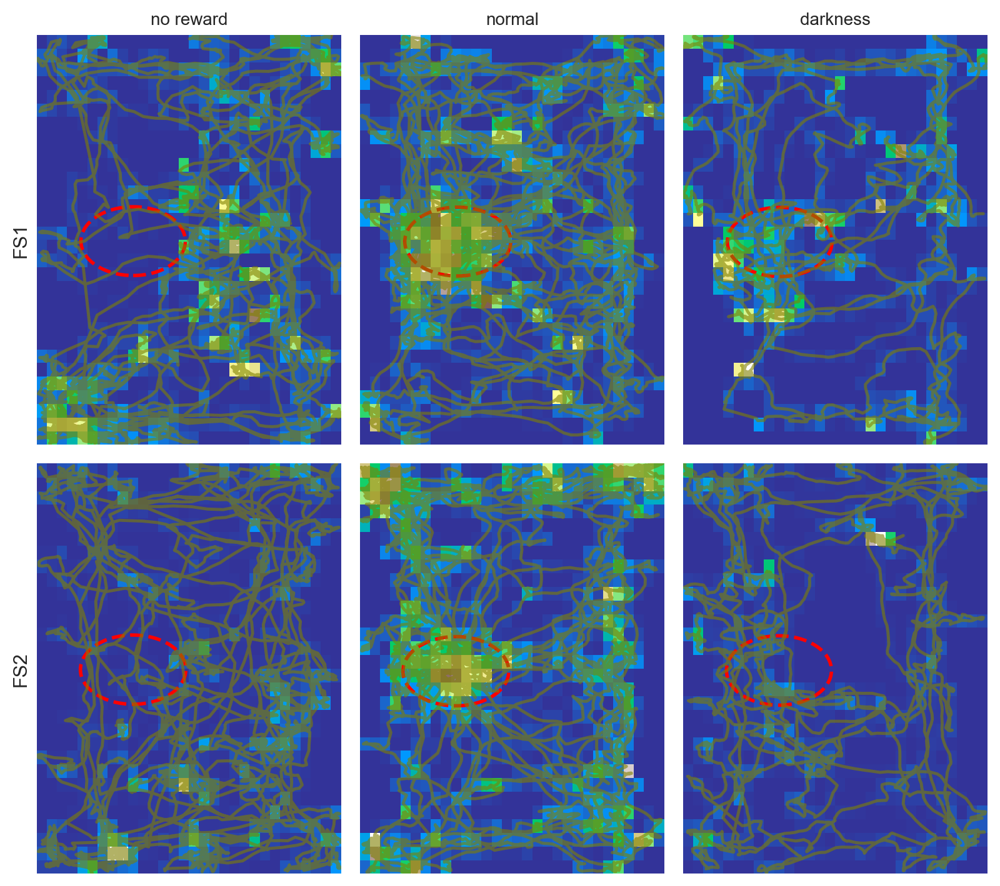

In [21]:


fig,ax = plt.subplots(2,3)
fig.set_size_inches(16.2/2, 7.2)
plt.xticks([])

ax[0,0].hist2d(Day46_fs1x,Day46_fs1y,bins = 30,cmap='terrain',cmax=1000 )
ax[0,0].plot(Day46_fs1x,Day46_fs1y,color='olive',alpha=.6)


ax[1,0].hist2d(Day46_fs2x,Day46_fs2y,bins = 30,cmap='terrain',cmax=1000 )
ax[1,0].plot(Day46_fs2x,Day46_fs2y,color='olive',alpha=.6)

ax[0,1].hist2d(Day47_fs1x,Day47_fs1y,bins = 30,cmap='terrain',cmax=1000,)
ax[0,1].plot(Day47_fs1x,Day47_fs1y,color='olive',alpha=.6,)

ax[1,1].hist2d(Day47_fs2x,Day47_fs2y,bins = 30,cmap='terrain',cmax=1000 )
ax[1,1].plot(Day47_fs2x,Day47_fs2y,color='olive',alpha=.6)

ax[0,2].hist2d(Day48_fs1x,Day48_fs1y,bins = 30,cmap='terrain',cmax=1000 )
ax[0,2].plot(Day48_fs1x,Day48_fs1y,color='olive',alpha=.6)

ax[1,2].hist2d(Day48_fs2x,Day48_fs2y,bins = 30,cmap='terrain',cmax=1000 )
ax[1,2].plot(Day48_fs2x,Day48_fs2y,color='olive',alpha=.6)


ax[0,0].add_patch(mpl.patches.Circle((-.3429, 0.2),.15,edgecolor='red', fill = False,linestyle='--',linewidth=2))
ax[1,0].add_patch(mpl.patches.Circle((-.3429, 0.2),.15,edgecolor='red', fill = False,linestyle='--',linewidth=2))
ax[0,1].add_patch(mpl.patches.Circle((-.3429, 0.2),.15,edgecolor='red', fill = False,linestyle='--',linewidth=2))
ax[1,1].add_patch(mpl.patches.Circle((-.3429, 0.2),.15,edgecolor='red', fill = False,linestyle='--',linewidth=2))
ax[0,2].add_patch(mpl.patches.Circle((-.3429, 0.2),.15,edgecolor='red', fill = False,linestyle='--',linewidth=2))
ax[1,2].add_patch(mpl.patches.Circle((-.3429, 0.2),.15,edgecolor='red', fill = False,linestyle='--',linewidth=2))

ax[0,0].set_title('no reward', fontsize=10)
ax[0,1].set_title('normal', fontsize=10)
ax[0,2].set_title('darkness', fontsize=10)
ax[0,0].set_ylabel('FS1')
ax[1,0].set_ylabel('FS2')
ax[0,2].set_xticks([])
ax[0,1].set_xticks([])
ax[0,0].set_xticks([])
ax[1,2].set_xticks([])
ax[1,1].set_xticks([])
ax[1,0].set_xticks([])
ax[0,2].set_yticks([])
ax[0,1].set_yticks([])
ax[0,0].set_yticks([])
ax[1,2].set_yticks([])
ax[1,1].set_yticks([])
ax[1,0].set_yticks([])


    

fig.dpi=200
plt.tight_layout()
plt.savefig('comparison')


<Figure size 1440x720 with 0 Axes>

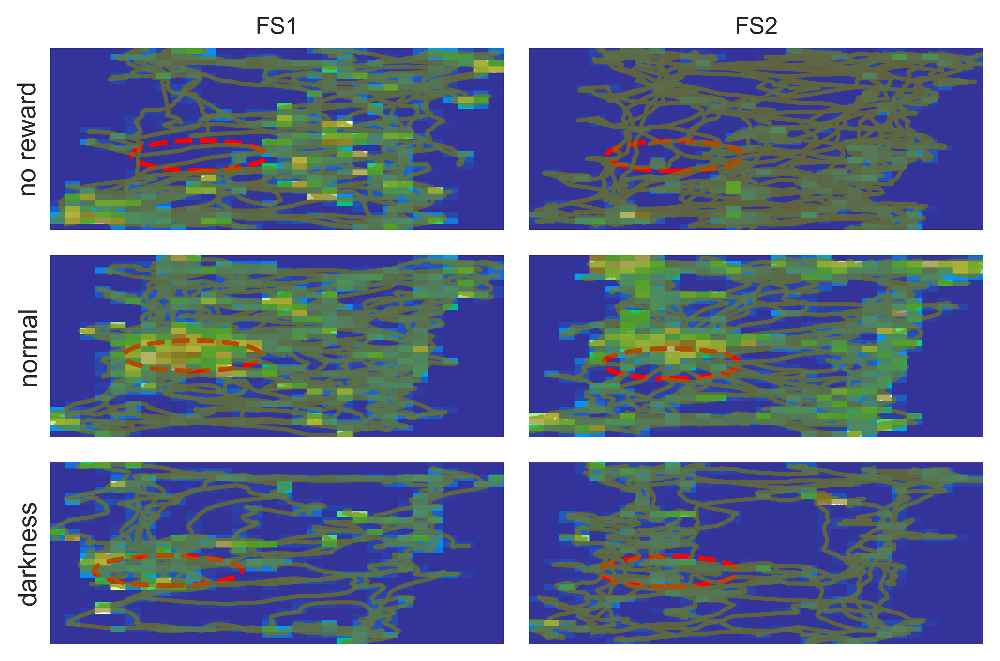

In [9]:
plt.figure(figsize=(20, 10))
fig,ax = plt.subplots(3,2)
plt.xticks([])

ax[0,0].hist2d(Day46_fs1[1][6500:11500],Day46_fs1[3][6500:11500],bins = 30,cmap='terrain',cmax=1000 )
#ax[0,0].plot(Day46_fs1[1][6500:11500],Day46_fs1[3][6500:11500],shade=True,kernel='gau',n_levels=100,cmap='terrain',)
ax[0,0].plot(Day46_fs1[1][6500:11500],Day46_fs1[3][6500:11500],color='olive',alpha=.6)


ax[0,1].hist2d(Day46_fs2[1][1200:6800],Day46_fs2[3][1200:6800],bins = 30,cmap='terrain',cmax=1000 )
ax[0,1].plot(Day46_fs2[1][1200:6800],Day46_fs2[3][1200:6800],color='olive',alpha=.6)

ax[1,0].hist2d(Day47_fs1[1][5500:15500],Day47_fs1[3][5500:15500],bins = 30,cmap='terrain',cmax=1000,)
ax[1,0].plot(Day47_fs1[1][5500:15500],Day47_fs1[3][5500:15500],color='olive',alpha=.6,)

ax[1,1].hist2d(Day47_fs2[1][2500:12500],Day47_fs2[3][2500:12500],bins = 30,cmap='terrain',cmax=1000 )
ax[1,1].plot(Day47_fs2[1][2500:12500],Day47_fs2[3][2500:12500],color='olive',alpha=.6)

ax[2,0].hist2d(Day48_fs1[1][6500:10500],Day48_fs1[3][6500:10500],bins = 30,cmap='terrain',cmax=1000 )
ax[2,0].plot(Day48_fs1[1][6500:10500],Day48_fs1[3][6500:10500],color='olive',alpha=.6)

ax[2,1].hist2d(Day48_fs2[1][1500:6500],Day48_fs2[3][1500:6500],bins = 30,cmap='terrain',cmax=1000 )
ax[2,1].plot(Day48_fs2[1][1500:6500],Day48_fs2[3][1500:6500],color='olive',alpha=.6)

ax[0,0].add_patch(mpl.patches.Circle((-.3429, 0.0544),.15,edgecolor='red', fill = False,linestyle='--',linewidth=2))
ax[0,1].add_patch(mpl.patches.Circle((-.3429, 0.0544),.15,edgecolor='red', fill = False,linestyle='--',linewidth=2))
ax[1,0].add_patch(mpl.patches.Circle((-.3429, 0.144),.15,edgecolor='red', fill = False,linestyle='--',linewidth=2))
ax[1,1].add_patch(mpl.patches.Circle((-.3429, 0.0544),.15,edgecolor='red', fill = False,linestyle='--',linewidth=2))
ax[2,0].add_patch(mpl.patches.Circle((-.3429, 0.0544),.15,edgecolor='red', fill = False,linestyle='--',linewidth=2))
ax[2,1].add_patch(mpl.patches.Circle((-.3429, 0.0544),.15,edgecolor='red', fill = False,linestyle='--',linewidth=2))

ax[0,0].set_title('FS1', fontsize=10)
ax[0,1].set_title('FS2', fontsize=10)
ax[0,0].set_ylabel('no reward')
ax[1,0].set_ylabel('normal')
ax[2,0].set_ylabel('darkness')
ax[2,0].set_xticks([])
ax[1,0].set_xticks([])
ax[0,0].set_xticks([])
ax[2,1].set_xticks([])
ax[1,1].set_xticks([])
ax[0,1].set_xticks([])
ax[2,0].set_yticks([])
ax[1,0].set_yticks([])
ax[0,0].set_yticks([])
ax[2,1].set_yticks([])
ax[1,1].set_yticks([])
ax[0,1].set_yticks([])


    

fig.dpi=500
plt.tight_layout()
plt.savefig('comparison')




# Looking specificaly at FS1 day 47

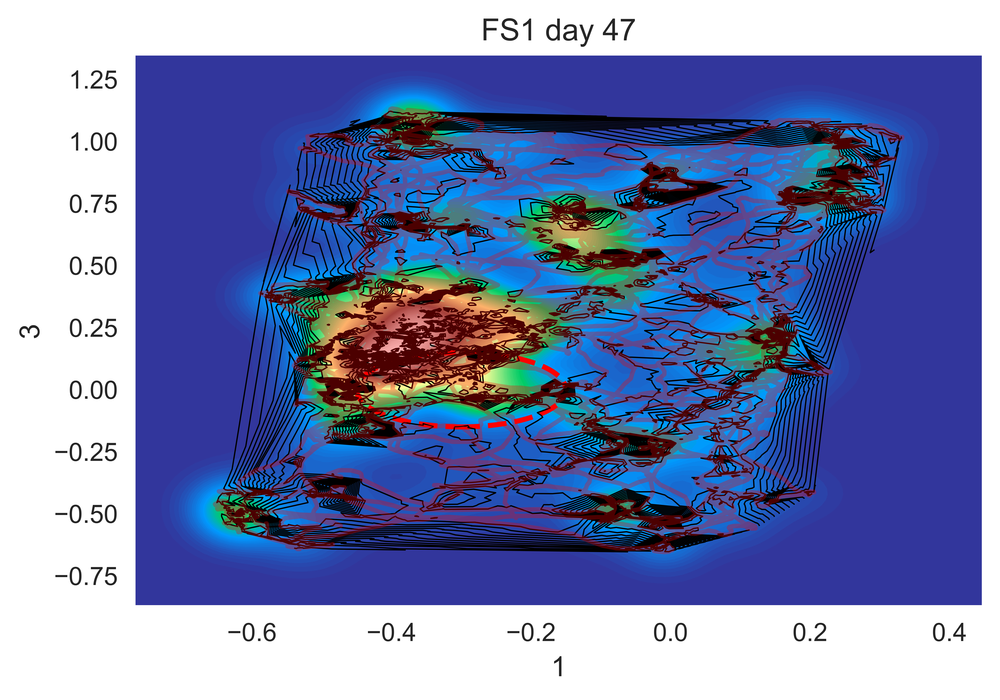

In [10]:
from matplotlib.patches import Circle
import matplotlib.tri as tri
fig, (ax1) = plt.subplots(nrows=1)
ax1.tricontour(Day47_fs1[1][5500:15500],Day47_fs1[3][5500:15500],Day47_fs1[2][5500:15500],levels=14, linewidths=0.5, colors='k')
ax1.plot(Day47_fs1[1][5500:15500],Day47_fs1[3][5500:15500],color='red',alpha=.3,)
ax1=sns.kdeplot(Day47_fs1[1][5500:15500],Day47_fs1[3][5500:15500],shade=True,kernel='gau',n_levels=100,cmap='terrain',)
ax1.set_title('FS1 day 47')
#Signify the beacon
cir = Circle((-.3, 0),.15,edgecolor='red', fill = False,linestyle='--',linewidth=2)
ax1.add_patch(cir)

fig.dpi=1500
plt.savefig('mountain')


In [11]:
#TODO - Mark precise locatio nof the beacon. DONE

## Trying to represent the data uniformly. 

### Using scipy Euler conversion 

In [12]:
newx=(Day47_fs1[1][5500:15500]).as_euler('x',5,degrees=True)
#newy=Day47_fs1[3][5500:15500]

AttributeError: 'Series' object has no attribute 'as_euler'

In [ ]:
newx=(Day47_fs1[1][5500:15500])
newy=Day47_fs1[3][5500:15500]

In [ ]:
alpha = 95 * np.pi / 180
x = newx * np.cos(alpha) - newy * np.sin(alpha)
y = newx * np.sin(alpha) + newy * np.cos(alpha)

plt.plot(x, y)

In [ ]:
(newx*np.cos(0.0872665) - newy*np.sin(0.0872665) , newx*np.sin(0.0872665) + newy*np.cos(0.0872665))

In [ ]:
fig, (ax1) = plt.subplots(nrows=1)
ax1.plot(xy)

In [ ]:
from matplotlib.patches import Circle
import matplotlib.tri as tri
fig, (ax1) = plt.subplots(nrows=1)
#ax1.tricontour(Day47_fs1[1][5500:15500],Day47_fs1[3][5500:15500],Day47_fs1[2][5500:15500],levels=14, linewidths=0.5, colors='k')
ax1.plot(Day47_fs1[1][5500:15500],Day47_fs1[3][5500:15500],color='red',alpha=.3,)
#ax1=sns.kdeplot(Day47_fs1[1][5500:15500],Day47_fs1[3][5500:15500],shade=True,kernel='gau',n_levels=100,cmap='terrain',)
ax1.set_title('FS1 day 47')
#Signify the beacon
cir = Circle((-.3, 0.2),.15,edgecolor='red', fill = False,linestyle='--',linewidth=2)
ax1.add_patch(cir)

fig.dpi=1500
plt.savefig('mountain')